In [33]:
import pandas as pd 

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

pd.set_option('display.max.columns', None)

pd.set_option('display.max_rows', None)

In [34]:
df = pd.read_excel(r"C:\Users\Mar\Documents\Data Analytics\AProjects 2024\World Economic Indicators\WorldBank.xlsx")

df

,Country Name,Country Code,Region,IncomeGroup,Year,"Birth rate, crude (per 1,000 people)","Death rate, crude (per 1,000 people)",Electric power consumption (kWh per capita),GDP (USD),GDP per capita (USD),Individuals using the Internet (% of population),"Infant mortality rate (per 1,000 live births)",Life expectancy at birth (years),Population density (people per sq. km of land area),Unemployment (% of total labor force) (modeled ILO estimate)
0,Afghanistan,AFG,South Asia,Low income,2018,NaN,NaN,NaN,1.936300e+10,520.8970,NaN,47.9,NaN,56.937800,1.542
1,Afghanistan,AFG,South Asia,Low income,2017,33.21100,6.57500,NaN,2.019180e+10,556.3020,13.500000,49.5,64.1300,55.596000,1.559
2,Afghanistan,AFG,South Asia,Low income,2016,33.98100,6.74200,NaN,1.936260e+10,547.2280,11.200000,51.2,63.7630,54.197100,1.634
3,Afghanistan,AFG,South Asia,Low income,2015,34.80900,6.92900,NaN,1.990710e+10,578.4660,8.260000,53.1,63.3770,52.712100,1.679
4,Afghanistan,AFG,South Asia,Low income,2014,35.70600,7.14100,NaN,2.048490e+10,613.8560,7.000000,55.1,62.9660,51.114800,1.735
5,Afghanistan,AFG,South Asia,Low income,2013,36.67000,7.38000,NaN,2.056110e+10,637.1650,5.900000,57.3,62.5250,49.428000,1.725
6,Afghanistan,AFG,South Asia,Low income,2012,37.69000,7.64500,NaN,2.000160e+10,641.8720,5.454550,59.5,62.0540,47.730600,1.692
7,Afghanistan,AFG,South Asia,Low income,2011,38.75000,7.93600,NaN,1.780430e+10,591.1620,5.000000,61.9,61.5530,46.131500,1.984
8,Afghanistan,AFG,South Asia,Low income,2010,39.82900,8.25000,NaN,1.585660e+10,543.3030,4.000000,64.3,61.0280,44.704100,2.275
9,Afghanistan,AFG,South Asia,Low income,2009,40.90300,8.58400,NaN,1.243910e+10,438.0760,3.550000,66.8,60.4840,43.493000,2.470


In [35]:
df.shape

(12449, 15)

In [36]:
df.columns

Index(['Country Name', 'Country Code', 'Region', 'IncomeGroup', 'Year',
       'Birth rate, crude (per 1,000 people)',
       'Death rate, crude (per 1,000 people)',
       'Electric power consumption (kWh per capita)', 'GDP (USD)',
       'GDP per capita (USD)',
       'Individuals using the Internet (% of population)',
       'Infant mortality rate (per 1,000 live births)',
       'Life expectancy at birth (years)',
       'Population density (people per sq. km of land area)',
       'Unemployment (% of total labor force) (modeled ILO estimate)'],
      dtype='object')

In [37]:
## Changing Column Names 

new_col_names = {
   'Birth rate, crude (per 1,000 people)': 'Birth %',
    'Death rate, crude (per 1,000 people)' : 'Death %',
    'Electric power consumption (kWh per capita)' : 'Electric Power Consumption',
    'Individuals using the Internet (% of population)': 'Population % using Internet',
    'Infant mortality rate (per 1,000 live births)' : 'Infant mortality %',
    'Life expectancy at birth (years)': 'Life Expectacy',
    'Population density (people per sq. km of land area)': 'Population Density',
    'Unemployment (% of total labor force) (modeled ILO estimate)' : 'Unemployment %'
    
}

df.rename(columns=new_col_names, inplace=True)

df.head(3)

,Country Name,Country Code,Region,IncomeGroup,Year,Birth %,Death %,Electric Power Consumption,GDP (USD),GDP per capita (USD),Population % using Internet,Infant mortality %,Life Expectacy,Population Density,Unemployment %
0,Afghanistan,AFG,South Asia,Low income,2018,NaN,NaN,NaN,1.936300e+10,520.897,NaN,47.9,NaN,56.9378,1.542
1,Afghanistan,AFG,South Asia,Low income,2017,33.211,6.575,NaN,2.019180e+10,556.302,13.5,49.5,64.130,55.5960,1.559
2,Afghanistan,AFG,South Asia,Low income,2016,33.981,6.742,NaN,1.936260e+10,547.228,11.2,51.2,63.763,54.1971,1.634


In [38]:
df['GDP (USD)'].dtype

dtype('float64')

In [39]:
unique_countries = df['Country Name'].unique()

unique_countries 

array(['Afghanistan', 'Albania', 'Algeria', 'American Samoa', 'Andorra',
       'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Cayman Islands', 'Central African Republic', 'Chad',
       'Channel Islands', 'Chile', 'China', 'Colombia', 'Comoros',
       'Congo, Dem. Rep.', 'Congo, Rep.', 'Costa Rica', "Cote d'Ivoire",
       'Croatia', 'Cuba', 'Curacao', 'Cyprus', 'Czech Republic',
       'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador',
       'Egypt, Arab Rep.', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Faroe Islands', 'Fiji',
       'Finland',

In [50]:
## simplifying country names

country_rename = {
    'Bahamas, The': 'Bahamas', 
    'Egypt, Arab Rep.': 'Egypt',
    'Gambia, The': 'Gambia',
    'Hong Kong SAR, China': 'Hong Kong',
    'Iran, Islamic Rep.': 'Iran',
    'Korea, Rep.': 'South Korea',
    'Macao SAR, China': 'Macao',
    'Syrian Arab Republic': 'Syria',
     'Venezuela, RB': 'Venezuela',
    'Yemen, Rep.': 'Yemen',
    'Slovak Republic': 'Slovakia',
    "Cote d'Ivoire": "Côte d'Ivoire",
    'Czech Republic': 'Czechia' , 
    'Russian Federation': 'Russia',
    'Kyrgyz Republic': 'Kyrgyzstan', 
    'West Bank and Gaza': 'Palestine'
    
}

df['Country Name'] = df['Country Name'].replace(country_rename)

    

In [52]:
df['Region']

0          SA
1          SA
2          SA
3          SA
4          SA
5          SA
6          SA
7          SA
8          SA
9          SA
10         SA
11         SA
12         SA
13         SA
14         SA
15         SA
16         SA
17         SA
18         SA
19         SA
20         SA
21         SA
22         SA
23         SA
24         SA
25         SA
26         SA
27         SA
28         SA
29         SA
30         SA
31         SA
32         SA
33         SA
34         SA
35         SA
36         SA
37         SA
38         SA
39         SA
40         SA
41         SA
42         SA
43         SA
44         SA
45         SA
46         SA
47         SA
48         SA
49         SA
50         SA
51         SA
52         SA
53         SA
54         SA
55         SA
56         SA
57         SA
58         SA
59        ECA
60        ECA
61        ECA
62        ECA
63        ECA
64        ECA
65        ECA
66        ECA
67        ECA
68        ECA
69        ECA
70        ECA
71    

In [53]:
unique_regions = df['Region'].unique()

unique_regions

array(['SA', 'ECA', 'MENA', 'EAP', 'SSA', 'LAC', 'NA'], dtype=object)

In [54]:
## Replacing Long Regions Names 

region_name = {
    'South Asia': 'SA',
    'Europe & Central Asia': 'ECA',
    'Middle East & North Africa': 'MENA',
    'East Asia & Pacific': 'EAP',
     'Sub-Saharan Africa': 'SSA',
    'Latin America & Caribbean': 'LAC',
    'North America': 'NA'
    
}

df['Region'] = df['Region'].replace(region_name)

In [55]:
df['Region']

0          SA
1          SA
2          SA
3          SA
4          SA
5          SA
6          SA
7          SA
8          SA
9          SA
10         SA
11         SA
12         SA
13         SA
14         SA
15         SA
16         SA
17         SA
18         SA
19         SA
20         SA
21         SA
22         SA
23         SA
24         SA
25         SA
26         SA
27         SA
28         SA
29         SA
30         SA
31         SA
32         SA
33         SA
34         SA
35         SA
36         SA
37         SA
38         SA
39         SA
40         SA
41         SA
42         SA
43         SA
44         SA
45         SA
46         SA
47         SA
48         SA
49         SA
50         SA
51         SA
52         SA
53         SA
54         SA
55         SA
56         SA
57         SA
58         SA
59        ECA
60        ECA
61        ECA
62        ECA
63        ECA
64        ECA
65        ECA
66        ECA
67        ECA
68        ECA
69        ECA
70        ECA
71    

In [56]:
## Checking if Nulls :  found in 10 columns 

df.isna().sum()

Country Name                   0
Country Code                   0
Region                         0
IncomeGroup                    0
Year                           0
Birth %                        0
Death %                        0
Electric Power Consumption     0
GDP (USD)                      0
GDP per capita (USD)           0
Population % using Internet    0
Infant mortality %             0
Life Expectacy                 0
Population Density             0
Unemployment %                 0
dtype: int64

In [46]:
# Data Understanding 

Starting imputation process...

Remaining null values in each column:
Country Name                   0
Country Code                   0
Region                         0
IncomeGroup                    0
Year                           0
Birth %                        0
Death %                        0
Electric Power Consumption     0
GDP (USD)                      0
GDP per capita (USD)           0
Population % using Internet    0
Infant mortality %             0
Life Expectacy                 0
Population Density             0
Unemployment %                 0
dtype: int64

Analyzing specific column:

Processing column: Birth %
Data type: float64
Number of non-null values: 12449
Skewness of Birth %: 0.157495
Imputed Birth % with mean: 28.643276420454544


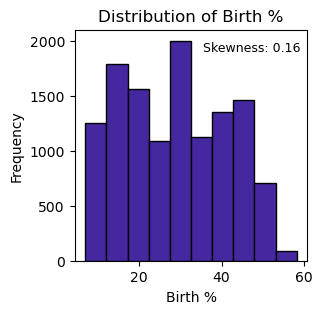

(0.15749533446439623, 28.643276420454544)

In [57]:
# To Identify columns with null values
null_columns = df.columns[df.isnull().any()]

# A Combined function to check distribution, plot histogram, and calculate skewness
def plot_histogram(column):
    print(f"\nProcessing column: {column}")
    print(f"Data type: {df[column].dtype}")
    print(f"Number of non-null values: {df[column].notnull().sum()}")
    
    if df[column].dtype not in ['int64', 'float64']:
        print(f"Skipping non-numeric column: {column}")
        return None, None
    
    if df[column].notnull().sum() > 0:
        skewness = skew(df[column].dropna())
        imputation_value = df[column].mean() if abs(skewness) < 0.5 else df[column].median()
        
# Print skewness and imputation details before plotting. This is very important to improve the readability and presentation of data output!!! I HAVE TO BE HONEST I HAD SOME STRUGGLE WITH THIS PART!
        print(f'Skewness of {column}: {skewness:.6f}')
        print(f'Imputed {column} with {"mean" if abs(skewness) < 0.5 else "median"}: {imputation_value}')

# To Plot the histogram
        plt.figure(figsize=(3, 3))
        ax = df[column].plot(kind='hist', bins=10, edgecolor='black', color='#4527A0')
        plt.title(f'Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        
        plt.text(
            x=0.97, y=0.95,
            s=f'Skewness: {skewness:.2f}', 
            ha='right', va='top',
            transform=ax.transAxes,
            fontsize=9, color='black',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
        )
        plt.show()
        
        return skewness, imputation_value
    else:
        print(f"No non-null values to plot for column: {column}")
        return None, None

# Function to impute nulls based on skewness
def impute_nulls(column):
    print(f"\nImputing column: {column}")
    
# Get skewness and plot histogram
    skewness, imputation_value = plot_histogram(column)
    if skewness is None:
        print(f"Skipping imputation for {column} as no valid skewness value.")
        return
    
# Perform imputation
    df[column].fillna(imputation_value, inplace=True)
    print(f'Imputed {column} with {"mean" if abs(skewness) < 0.5 else "median"}: {imputation_value}')

# Apply imputation to each column with null values
print("Starting imputation process...")
for column in null_columns:
    impute_nulls(column)

# Verify there are no more null values
print("\nRemaining null values in each column:")
print(df.isnull().sum())

# Example of calling the function for a specific column
print("\nAnalyzing specific column:")
plot_histogram('Birth %')

In [58]:
df.to_csv('C:\\Users\\Mar\\Documents\\Data Analytics\\AProjects 2024\\World Economic Indicators\\Development Indicators Cleaned.csv', index=False)